# AAP Assignment < Facial Recognition >


## Downloading the required libraries


In [1]:
!pip install face_recognition

# Load an image
#
def face_recognition_load_image(filename):
    return face_recognition.load_image_file(filename)

# Detect all faces and return the [x1, y1, x2, y2] coordinates in 
# a list.
#
def face_recognition_get_face_locations(image):
    results = face_recognition.face_locations(image)
    newresults = []
    for r in results:
        newresults.append([r[3], r[0], r[1], r[2]])
    return newresults

# Get the face 128-dimensional encodings of all detected faces
#
def face_recognition_get_face_encodings(image, face_locations):
    return face_recognition.face_encodings(image, known_face_locations=face_locations)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 100.1 MB 22 kB/s 
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566186 sha256=58f13faf75347914b77b36f3011a6dbe66fc2c146f4453aaba00ec94af5488a3
  Stored in directory: /root/.cache/pip/wheels/d6/81/3c/884bcd5e1c120ff548d57c2ecc9ebf3281c9a6f7c0e7e7947a
Successfully built face-recognition-models


## Import MTCNN and Facenet

In [2]:
!pip install mtcnn
from mtcnn import MTCNN

face_detector_mtcnn = MTCNN()


import tensorflow 
from tensorflow import keras

!curl https://raw.githubusercontent.com/satinder147/Attendance-using-Face/master/facenet_keras.h5 --output facenet_keras.h5


face_embedding_facenet = keras.models.load_model('facenet_keras.h5')


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 2.3 MB 7.5 MB/s 
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 88.1M  100 88.1M    0     0  14.3M      0  0:00:06  0:00:06 --:--:-- 22.4M


In [3]:
import cv2

def face_recognition_load_image(filename):
    img = cv2.imread(filename)
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

def face_recognition_get_face_locations(image):
    bounding_boxes = []
    detected_faces = face_detector_mtcnn.detect_faces(image)
    for detected_face in detected_faces:
        bounding_boxes.append([detected_face["box"][0], 
                              detected_face["box"][1], 
                              detected_face["box"][0] + detected_face["box"][2], 
                              detected_face["box"][1] + detected_face["box"][3]])
    return bounding_boxes

def crop_faces_to_160x160(img, bounding_boxes): 
    cropped_faces = []

    for (x1,y1,x2,y2) in bounding_boxes:
        cropped_face = img[y1:y2, x1:x2]
        # AT first I resized it to 160 by 160
        cropped_face = cv2.resize(cropped_face, (160, 160), interpolation=cv2.INTER_CUBIC)
        cropped_faces.append(cropped_face)
    
    return np.array(cropped_faces)

# Get the face 128-dimensional encodings of all detected faces
#
def face_recognition_get_face_encodings(image, face_locations):
    cropped_faces = crop_faces_to_160x160(image, face_locations)
    cropped_faces = (cropped_faces.astype("float32") - 128) / 128
    return face_embedding_facenet.predict(cropped_faces)

In [4]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
from IPython.display import display

# Draw a bounding box over the image with a 
# text.
#
def draw_box(img, x1, y1, x2, y2, text): 
    img = cv2.rectangle(img,(x1,y1),(x2,y2),(255,255,0),2)

    if text != "":
        img = cv2.rectangle(img,(x1,y1),(x2,y1 + 12),(255,255,0),-1)
        img = cv2.putText(img, text, (x1, y1 + 10), cv2.FONT_HERSHEY_PLAIN, 0.7, (0,0,0), 1, cv2.LINE_AA)

    return img


# Shows an image inline
#
def show_image(img):
    # IF using Jupyter Notebook, use uncomment this:
    #display(cv2.cvtColor(img, cv2.COLOR_RGB2BGR))

    # IF using Colab uncomment this:
    cv2_imshow(cv2.cvtColor(img, cv2.COLOR_RGB2BGR))

## Exporting the training data set 

In my data set I had included images of my teammates and myself, Celeste has 7 images, shaqilah has 4 images, yuki has 5 images, and for myself I have 4 images. I later then updated the data set by adding more images of Shaqilah as I was facing some difficulties with the accuracy for Shaqilah only.And then to better my and yuki's accuracy level I also decided to update the number of images of us. Now there are 7 images of celeste, 11 images of shaqilah, 7 images of me, and 8 images of yuki.

In [6]:
!unzip Photos.zip
folder = 'Photos/'

Archive:  Photos.zip
  inflating: Photos/Celeste (2).jpeg  
  inflating: Photos/Celeste (3).jpeg  
  inflating: Photos/Celeste (4).jpeg  
  inflating: Photos/Celeste (5).jpeg  
  inflating: Photos/Celeste (6).jpeg  
  inflating: Photos/Celeste (7).jpeg  
  inflating: Photos/Celeste.jpeg     
  inflating: Photos/Shaqilah (1).jpeg  
  inflating: Photos/Shaqilah (10).jpeg  
  inflating: Photos/Shaqilah (2).jpeg  
  inflating: Photos/Shaqilah (3).jpeg  
  inflating: Photos/Shaqilah (4).jpeg  
  inflating: Photos/Shaqilah (5).jpeg  
  inflating: Photos/Shaqilah (6).jpeg  
  inflating: Photos/Shaqilah (7).jpeg  
  inflating: Photos/Shaqilah (8).jpeg  
  inflating: Photos/Shaqilah (9).jpeg  
  inflating: Photos/Shaqilah.jpeg    
  inflating: Photos/Siqi (2).png     
  inflating: Photos/Siqi (3).png     
  inflating: Photos/Siqi (4).png     
  inflating: Photos/Siqi (5).jpeg    
  inflating: Photos/Siqi (6).jpeg    
  inflating: Photos/Siqi (7).jpeg    
  inflating: Photos/Siqi.png         
  

In [7]:
import os
import sklearn.neighbors
import sklearn.svm

face_names_and_files = {
    "Celeste":      ["Photos/Celeste.jpeg", "Photos/Celeste (2).jpeg", "Photos/Celeste (3).jpeg", "Photos/Celeste (4).jpeg", "Photos/Celeste (5).jpeg", "Photos/Celeste (6).jpeg", "Photos/Celeste (7).jpeg"],
    "Shaqilah": ["Photos/Shaqilah.jpeg", "Photos/Shaqilah (1).jpeg", "Photos/Shaqilah (2).jpeg", "Photos/Shaqilah (3).jpeg","Photos/Shaqilah (4).jpeg", "Photos/Shaqilah (5).jpeg", "Photos/Shaqilah (6).jpeg", "Photos/Shaqilah (7).jpeg","Photos/Shaqilah (8).jpeg", "Photos/Shaqilah (9).jpeg", "Photos/Shaqilah (10).jpeg"],
    "Yuki":   ["Photos/Yuki.jpeg", "Photos/Yuki (2).jpeg", "Photos/Yuki (3).jpeg", "Photos/Yuki (4).jpeg", "Photos/Yuki (5).jpeg", "Photos/Yuki (6).jpeg", "Photos/Yuki (7).jpeg", "Photos/Yuki (8).jpeg"],
    "SiQi": ["Photos/Siqi.png", "Photos/Siqi (2).png", "Photos/Siqi (3).png", "Photos/Siqi (4).png", "Photos/Siqi (5).jpeg", "Photos/Siqi (6).jpeg", "Photos/Siqi (7).jpeg"],
    "Unknown": ["Photos/unknown.jpg"]
}
face_names = []
x = []
y = []
face_index = 0

# TODO:
# Loop through all sub-folders under the "data" folder.
#
# The sub-folder names will store the name of the person that we are
# trying to learn to recognize.
#
for face_name in face_names_and_files:

    # Save the face name
    #
    face_names.append(face_name)
 
    print (face_name)

    # List all files within the folder of the person
    #
    for file_name in face_names_and_files[face_name]:

        # Print the name of the file
        #
        print ("  " + file_name)

        # Load the image and extract the encoding
        #
        image = face_recognition_load_image(file_name)
        face_locations = face_recognition_get_face_locations(image)

        if (len(face_locations) > 0):
            face_encoding = face_recognition_get_face_encodings(image, face_locations)[0]
        else:
            continue

        # Insert the face encoding as the input (x) data, and the face index as
        # the output (y) data that we want our model to learn.
        #
        x.append(face_encoding)
        y.append(face_index)

    face_index += 1

Celeste
  Photos/Celeste.jpeg
  Photos/Celeste (2).jpeg
  Photos/Celeste (3).jpeg
  Photos/Celeste (4).jpeg
  Photos/Celeste (5).jpeg
  Photos/Celeste (6).jpeg
  Photos/Celeste (7).jpeg
Shaqilah
  Photos/Shaqilah.jpeg
  Photos/Shaqilah (1).jpeg
  Photos/Shaqilah (2).jpeg
  Photos/Shaqilah (3).jpeg
  Photos/Shaqilah (4).jpeg
  Photos/Shaqilah (5).jpeg
  Photos/Shaqilah (6).jpeg
  Photos/Shaqilah (7).jpeg
  Photos/Shaqilah (8).jpeg
  Photos/Shaqilah (9).jpeg
  Photos/Shaqilah (10).jpeg
Yuki
  Photos/Yuki.jpeg
  Photos/Yuki (2).jpeg
  Photos/Yuki (3).jpeg
  Photos/Yuki (4).jpeg
  Photos/Yuki (5).jpeg
  Photos/Yuki (6).jpeg
  Photos/Yuki (7).jpeg
  Photos/Yuki (8).jpeg
SiQi
  Photos/Siqi.png
  Photos/Siqi (2).png
  Photos/Siqi (3).png
  Photos/Siqi (4).png
  Photos/Siqi (5).jpeg
  Photos/Siqi (6).jpeg
  Photos/Siqi (7).jpeg
Unknown
  Photos/unknown.jpg


# Classifier type
At first I used a knn classifier for my model of n_neighbors = 3 with original dataset of 7 images of celeste, 4 images of shaqilah, 5 images of yuki, and 4 images of myself, however after testing out the model I have found that the accuracy levels were not that high, even though it could detect yuki and celeste, the model could not detect shaqilah at all for our team picture, even when she was alone, it would label her celeste or yuki, So I tried out the Haar Cascade classifier. After using Haar Cascade it seemed like the accuracy was not any better for shaqilah, even after adding more images of shaqilah, so I decided to use the knn classifier again but this time I changed the n_neighbors to 5.However, the accuracy for shaqilah worsened as it labeled her as celeste. Afterwards I tried 2 and it was able to identify shaqilah and celeste more accurately but yuki was no longer detected correctly, so I then went back with the original n_neighbors = 3.


In [8]:
#classifier = sklearn.neighbors.KNeighborsClassifier(n_neighbors=2)
#classifier = sklearn.neighbors.KNeighborsClassifier(n_neighbors=5)
#
classifier = sklearn.neighbors.KNeighborsClassifier(n_neighbors=3)
#classifier = sklearn.svm.SVC(probability=True)
#
classifier.fit(x, y)


print("Training complete")

Training complete


In [9]:
def recognize_face(filename, threshold=0.5):
    # I used threshold 0.2 at first 
    # Load image
    #
    image = face_recognition_load_image(filename)

    # Detect faces and retrieve locations.
    #
    face_locations = face_recognition_get_face_locations(image)

    # Retrieve face encodings.
    #
    if (len(face_locations) > 0):
        face_encodings = face_recognition_get_face_encodings(image, face_locations)
    else:
        return []

    # Compute the probabilities of all face embeddings using the SVM
    # classifier.
    # 
    probabilities = classifier.predict_proba(face_encodings)

    # Now run through the probability outputs from SVM
    # and construct a set of results to be returned to the caller
    # 
    result = []
    for i in range(0, len(face_locations)):
        best_face_index = np.argmax(probabilities[i])

        # Construct the result to be returned
        #
        if probabilities[i][best_face_index] >= threshold:
            result.append({ "box": face_locations[i], "face" : best_face_index, "face_name": face_names[best_face_index], "score": probabilities[i][best_face_index] })
        else:
            result.append({ "box": face_locations[i], "face" : -1, "face_name": "??", "score": 0.0 })

    return result


# Testing of images

In [5]:
!unzip Test.zip
flder = '/Test'

Archive:  Test.zip
  inflating: Test/Celeste.jpeg       
  inflating: Test/Shaqilah (7).jpeg  
  inflating: Test/Siqi.jpeg          
  inflating: Test/Team picture.jpeg  
  inflating: Test/Yuki.png           


In [ ]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f:
    f.write(binary)
  return filename

In [ ]:
from IPython.display import Image
try:
  filename = take_photo()
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))
  

## Test case 1 
I took a picture of myself (SiQi) to test out the accuracy of the model, and it correctly identified me with 100 percent confidence level

[{'box': [267, 169, 464, 412], 'face': 3, 'face_name': 'SiQi', 'score': 1.0}]


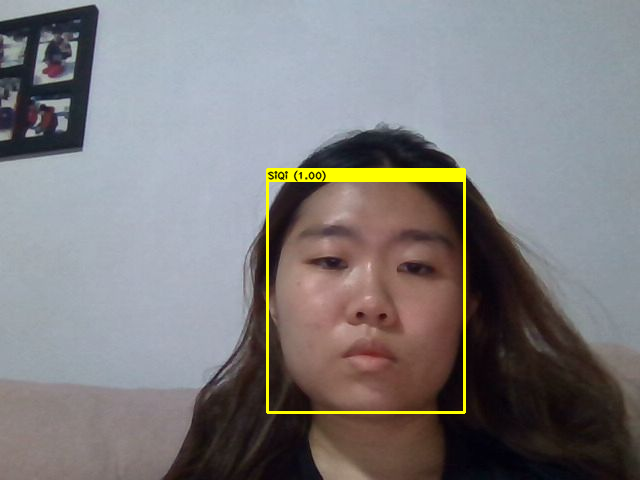

In [ ]:
filename2 = 'photo.jpg'
img = face_recognition_load_image(filename2)
results = recognize_face(filename2)

print(results)
for r in results:
    draw_box(img, r["box"][0], r["box"][1], r["box"][2], r["box"][3], r["face_name"] + " (%4.2f)" % (r["score"]))

# Display the image
#
show_image(img)


## Test case 2 
I tried a filtered picture of yuki, and the model was able to detect yuki. With 100 percent confidence 

[{'box': [277, 157, 415, 341], 'face': 2, 'face_name': 'Yuki', 'score': 1.0}]


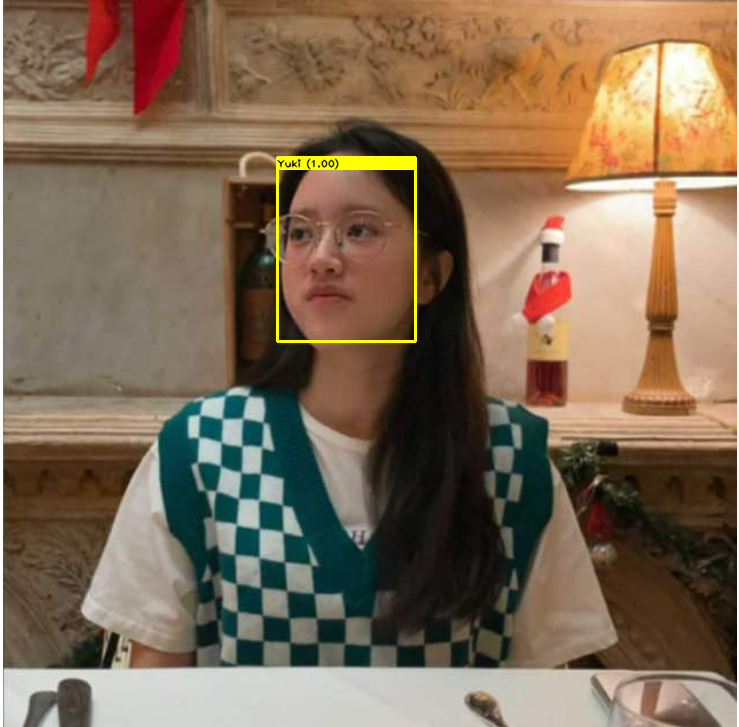

In [ ]:
filename = 'Test/Yuki.png' 

# Load image
#
img = face_recognition_load_image(filename)

# Recognize face
#
results = recognize_face(filename)

print (results)

# Draw the bounding boxes and the recognized face name
for r in results:
    draw_box(img, r["box"][0], r["box"][1], r["box"][2], r["box"][3], r["face_name"] + " (%4.2f)" % (r["score"]))

# Display the image
#
show_image(img)


## Test case 3
I tested out the model with a selfie of celeste, and the model was able to identify the person as celeste but with 67 percent confidence level.

[{'box': [470, 686, 1152, 1610], 'face': 0, 'face_name': 'Celeste', 'score': 0.6666666666666666}]


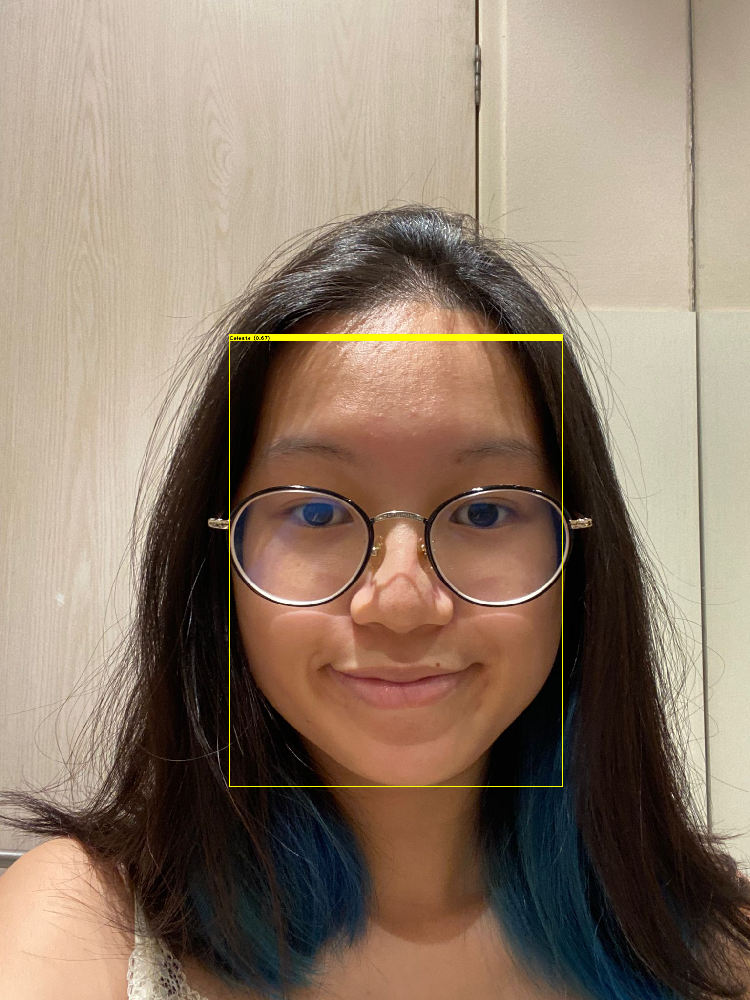

In [10]:
image2 = 'Test/Celeste.jpeg'
img = face_recognition_load_image(image2)
results = recognize_face(image2)

print (results)

# Draw the bounding boxes and the recognized face name
for r in results:
    draw_box(img, r["box"][0], r["box"][1], r["box"][2], r["box"][3], r["face_name"] + " (%4.2f)" % (r["score"]))

# Display the image
#
show_image(img)

## Test case 4 
For shaqilah I had struggled before when the model was using roughly only 4 images of her and originally could not detect shaqilah in this picture but now it is able to detect shaqilah with 67 percent confidence level.

[{'box': [947, 163, 1334, 656], 'face': 1, 'face_name': 'Shaqilah', 'score': 0.6666666666666666}, {'box': [486, 197, 882, 704], 'face': -1, 'face_name': '??', 'score': 0.0}, {'box': [1502, 12, 1595, 117], 'face': -1, 'face_name': '??', 'score': 0.0}, {'box': [1, 74, 44, 138], 'face': 3, 'face_name': 'SiQi', 'score': 0.6666666666666666}, {'box': [351, 1118, 380, 1153], 'face': -1, 'face_name': '??', 'score': 0.0}]


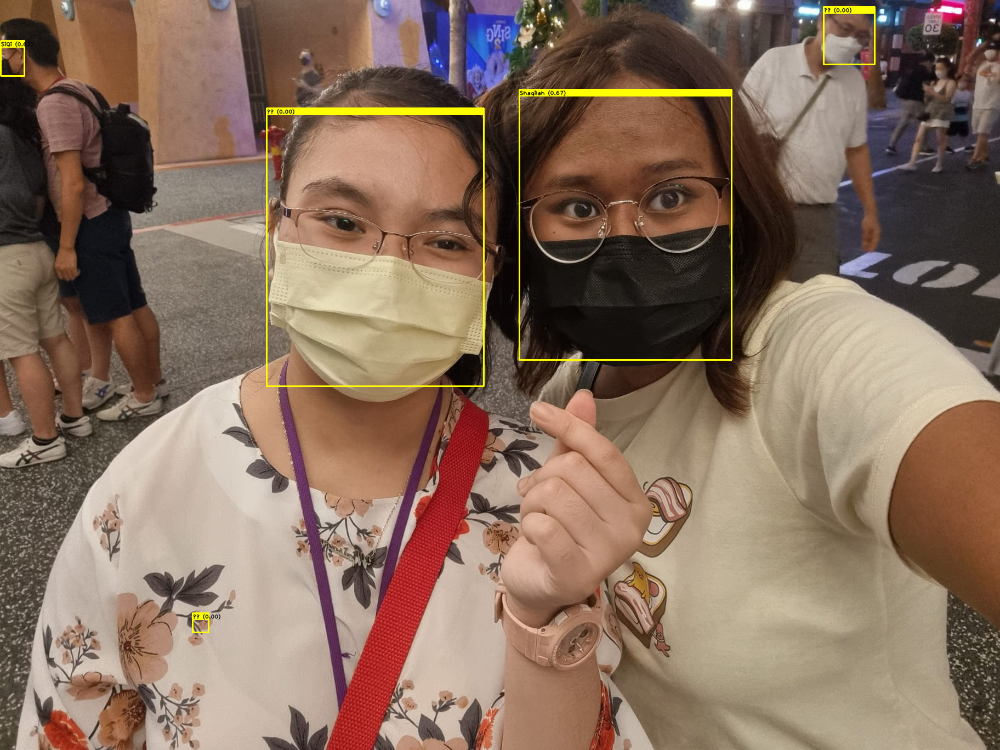

In [ ]:
testimg = 'Test/Shaqilah (7).jpeg'
img = face_recognition_load_image(testimg)
results = recognize_face(testimg)

print (results)

# Draw the bounding boxes and the recognized face name
for r in results:
    draw_box(img, r["box"][0], r["box"][1], r["box"][2], r["box"][3], r["face_name"] + " (%4.2f)" % (r["score"]))

# Display the image
#
show_image(img)

## Test case 5
I then tested out the team picture again but it seems that shaqilah is still not identified correctly, we think this maybe due to her hair but other than that we are still able to identify yuki and celeste correctly. Unfortunately the face on yuki's shirt is also identified as yuki so the model is still not very accurate.

[{'box': [958, 302, 1175, 581], 'face': 0, 'face_name': 'Celeste', 'score': 1.0}, {'box': [633, 201, 766, 371], 'face': 2, 'face_name': 'Yuki', 'score': 0.6666666666666666}, {'box': [248, 310, 452, 543], 'face': -1, 'face_name': '??', 'score': 0.0}, {'box': [727, 467, 839, 619], 'face': 2, 'face_name': 'Yuki', 'score': 0.6666666666666666}]


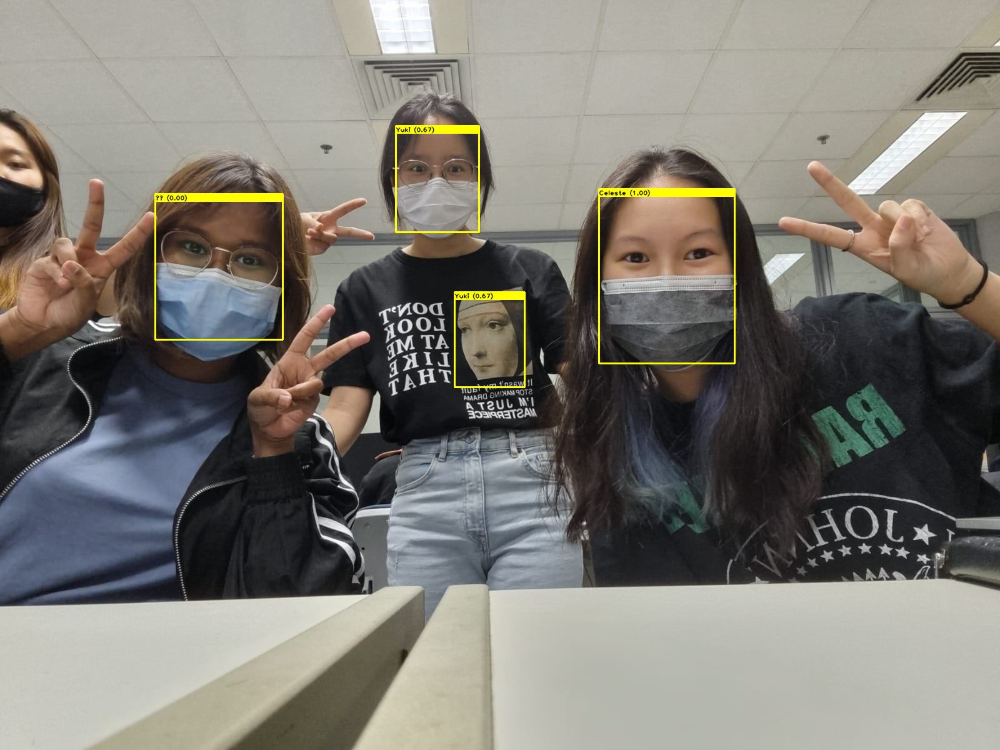

In [ ]:
image = 'Test/Team picture.jpeg'
img = face_recognition_load_image(image)
results = recognize_face(image)

print (results)

# Draw the bounding boxes and the recognized face name
for r in results:
    draw_box(img, r["box"][0], r["box"][1], r["box"][2], r["box"][3], r["face_name"] + " (%4.2f)" % (r["score"]))

# Display the image
#
show_image(img)